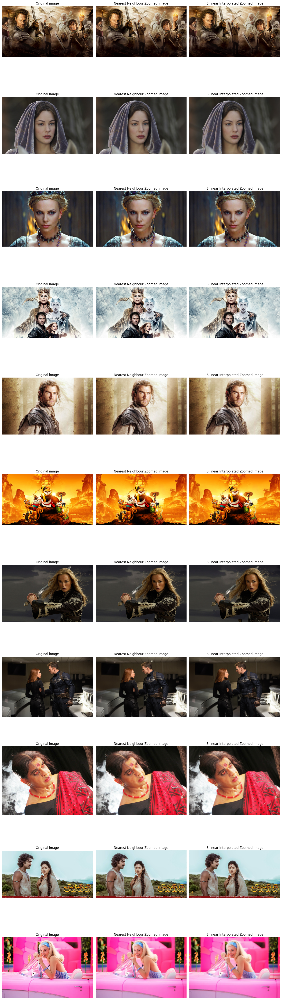

Normalized SSD for image 1 using nearest neighbour zooming: 0.02259017527103424
Normalized SSD for image 1 using bilinear interpolation zooming: 0.02075894922018051

Normalized SSD for image 2 using nearest neighbour zooming: 0.010239689610898495
Normalized SSD for image 2 using bilinear interpolation zooming: 0.00845386553555727

Normalized SSD for image 3 using nearest neighbour zooming: 0.014716919511556625
Normalized SSD for image 3 using bilinear interpolation zooming: 0.012744803912937641

Normalized SSD for image 4 using nearest neighbour zooming: 0.02687695622444153
Normalized SSD for image 4 using bilinear interpolation zooming: 0.025464089587330818

Normalized SSD for image 5 using nearest neighbour zooming: 0.01586480624973774
Normalized SSD for image 5 using bilinear interpolation zooming: 0.01523258350789547

Normalized SSD for image 6 using nearest neighbour zooming: 0.013682901859283447
Normalized SSD for image 6 using bilinear interpolation zooming: 0.012208652682602406

In [15]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import math

def zoom_nearest_neighbour(f):
  s=4
  rows, cols, channels = f.shape[0]*s , f.shape[1]*s, f.shape[2]
  zoomed = np.zeros((rows,cols,3))
  for ch in range(channels):
    for i in range(rows):
      for j in range(cols):
        zoomed[i][j][ch] = f[min(f.shape[0]-1,round(i/s))][min(f.shape[1]-1,round(j/s))][ch]
  zoomed = zoomed.astype('uint8')
  return zoomed

def zoom_bilinear_interpolation(f):
  s=4
  rows, cols, channels = f.shape[0]*s , f.shape[1]*s, f.shape[2]

  zoomed = np.zeros((rows,cols,3))
  for ch in range(channels):
    for i in range(rows):
      for j in range(cols):
        frac_x = i/s
        frac_y = j/s
        floor_x = math.floor(frac_x) 
        floor_y = math.floor(frac_y)
        ceil_x = math.ceil(frac_x) 
        ceil_y = math.ceil(frac_y)
        q1 = f[floor_x][floor_y][ch]
        q2 = f[min(ceil_x,f.shape[0]-1)][floor_y][ch]
        q3 = f[floor_x][min(ceil_y,f.shape[1]-1)][ch]
        q4 = f[min(floor_x,f.shape[0]-1)][min(ceil_y,f.shape[1]-1)][ch]
        r1 = q1*(frac_x - floor_x) + q2*(1 - frac_x + floor_x)
        r2 = q3*(frac_x - floor_x) + q4*(1 - frac_x + floor_x)
        r3 = r1*(frac_y - floor_y) + r2*(1 - frac_y + floor_y)

        zoomed[i,j,ch] = r3
  return zoomed.astype(np.uint8)

zoomed_outs = ["../Assignment1_Images/im01small.png", "../Assignment1_Images/im02small.png", "../Assignment1_Images/im03small.png","../Assignment1_Images/im04small.png", "../Assignment1_Images/im05small.png", "../Assignment1_Images/im06small.png","../Assignment1_Images/im07small.png", "../Assignment1_Images/im08small.png", "../Assignment1_Images/im09small.png","../Assignment1_Images/im10small.png", "../Assignment1_Images/im11small.png"]
originals = ["../Assignment1_Images/im01.png", "../Assignment1_Images/im02.png", "../Assignment1_Images/im03.png","../Assignment1_Images/im04.png", "../Assignment1_Images/im05.png", "../Assignment1_Images/im06.png","../Assignment1_Images/im07.png", "../Assignment1_Images/im08.png", "../Assignment1_Images/im09.png","../Assignment1_Images/im10.png", "../Assignment1_Images/im11.png"]

fig, ax = plt.subplots(11, 3, figsize=(15, 5*11))
normalized_ssds = []

for i in range(11):
    f = cv.imread(zoomed_outs[i],cv.IMREAD_COLOR)
    g = cv.imread(originals[i],cv.IMREAD_COLOR)
    assert f is not None

    zoomed_n = zoom_nearest_neighbour(f)
    zoomed_b = zoom_bilinear_interpolation(f)

    # Resize the zoomed image to match the size of the original using interpolation
    zoomed_n1 = cv.resize(zoomed_n, (g.shape[1], g.shape[0]), interpolation=cv.INTER_NEAREST)
    zoomed_b1 = cv.resize(zoomed_b, (g.shape[1], g.shape[0]), interpolation=cv.INTER_LINEAR)



    # Compute SSD for both zoomed images
    ssd_n = np.sum((g.astype(np.float32) - zoomed_n1.astype(np.float32)) ** 2)
    ssd_b = np.sum((g.astype(np.float32) - zoomed_b1.astype(np.float32)) ** 2)

    # Normalize the SSD by dividing with the maximum possible SSD value
    max_ssd = np.sum(g.astype(np.float32) ** 2)
    normalized_ssd_n = ssd_n / max_ssd
    normalized_ssd_b = ssd_b / max_ssd

    # Store the normalized SSD values
    normalized_ssds.append((normalized_ssd_n, normalized_ssd_b))

    ax[i,0].imshow(cv.cvtColor(g,cv.COLOR_BGR2RGB))
    ax[i,0].set_title('Original image')
    ax[i,0].axis('off')
    ax[i,1].imshow(cv.cvtColor(zoomed_n,cv.COLOR_BGR2RGB))
    ax[i,1].set_title('Nearest Neighbour Zoomed image')
    ax[i,1].axis('off')
    ax[i,2].imshow(cv.cvtColor(zoomed_b,cv.COLOR_BGR2RGB))
    ax[i,2].set_title('Bilinear Interpolated Zoomed image')
    ax[i,2].axis('off')


    
plt.tight_layout()
plt.savefig('Q8_all_images.png')
plt.show()

for i, (ssd_n, ssd_b) in enumerate(normalized_ssds):
    print(f"Normalized SSD for image {i+1} using nearest neighbour zooming: {ssd_n}")
    print(f"Normalized SSD for image {i+1} using bilinear interpolation zooming: {ssd_b}")
    print()